In [205]:
# libraries
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns

# preprocessing
from sklearn.preprocessing import StandardScaler   # for standardization
from sklearn.metrics import roc_auc_score         # for evaluation
from sklearn.model_selection import train_test_split

# models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV
from skopt import BayesSearchCV
from sklearn.model_selection import StratifiedKFold


DEFINICIÓN DEL PROBLEMA

Objetivo: Para este episodio de la serie, tu tarea es predecir si un cliente continúa con su cuenta o la cierra (por ejemplo, se da de baja).

El conjunto de datos para esta competencia (tanto el de entrenamiento como el de prueba) fue generado a partir de un modelo de aprendizaje profundo entrenado con el conjunto de datos de predicción de abandono de clientes bancarios. Las distribuciones de características son similares, pero no exactamente iguales a las originales. Siéntete libre de utilizar el conjunto de datos original como parte de esta competencia, tanto para explorar las diferencias como para ver si incorporar el original en el entrenamiento mejora el rendimiento del modelo.

ADQUISICIÓN DE DATOS

In [159]:
# Load data

data = pd.read_csv('datasets/train.csv')
data.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15581229.0,Ch'in,597.0,France,Male,45.0,7.0,0.00,1.0,1.0,1.0,72643.95,1.0
1,1,15808674.0,Li Fonti,738.0,Spain,Female,28.0,1.0,0.00,2.0,1.0,0.0,96885.19,0.0
2,2,15601796.0,Udinese,705.0,France,Male,47.0,7.0,69311.16,1.0,0.0,1.0,123866.43,0.0
3,3,15583724.0,Hsing,681.0,Germany,Female,51.0,4.0,181110.13,1.0,1.0,0.0,103560.98,1.0
4,4,15696826.0,Hsiung,479.0,Germany,Male,31.0,6.0,133043.66,2.0,1.0,0.0,61936.22,0.0


Customer ID: A unique identifier for each customer

Surname: The customer's surname or last name

Credit Score: A numerical value representing the customer's credit score

Geography: The country where the customer resides (France, Spain or Germany)

Gender: The customer's gender (Male or Female)

Age: The customer's age.

Tenure: The number of years the customer has been with the bank

Balance: The customer's account balance

NumOfProducts: The number of bank products the customer uses (e.g., savings account, credit card)

HasCrCard: Whether the customer has a credit card (1 = yes, 0 = no)

IsActiveMember: Whether the customer is an active member (1 = yes, 0 = no)

EstimatedSalary: The estimated salary of the customer

Exited: Whether the customer has churned (1 = yes, 0 = no)


PREPROCESAMIENTO DE DATOS

Eliminación de columna

In [160]:
# deleting columns not needed

columns_to_drop = ['id', 'CustomerId', 'Surname']

data = data.drop(columns=columns_to_drop)

data.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,597.0,France,Male,45.0,7.0,0.00,1.0,1.0,1.0,72643.95,1.0
1,738.0,Spain,Female,28.0,1.0,0.00,2.0,1.0,0.0,96885.19,0.0
2,705.0,France,Male,47.0,7.0,69311.16,1.0,0.0,1.0,123866.43,0.0
3,681.0,Germany,Female,51.0,4.0,181110.13,1.0,1.0,0.0,103560.98,1.0
4,479.0,Germany,Male,31.0,6.0,133043.66,2.0,1.0,0.0,61936.22,0.0


<Axes: >

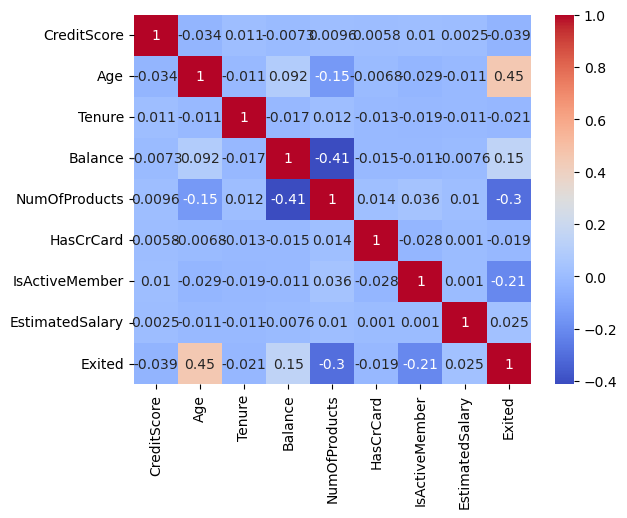

In [162]:
# matriz de correlación
numerical_columns = data.select_dtypes(include=[np.number]).columns
sns.heatmap(data[numerical_columns].corr(), annot=True, cmap='coolwarm')

<Axes: xlabel='Exited', ylabel='Count'>

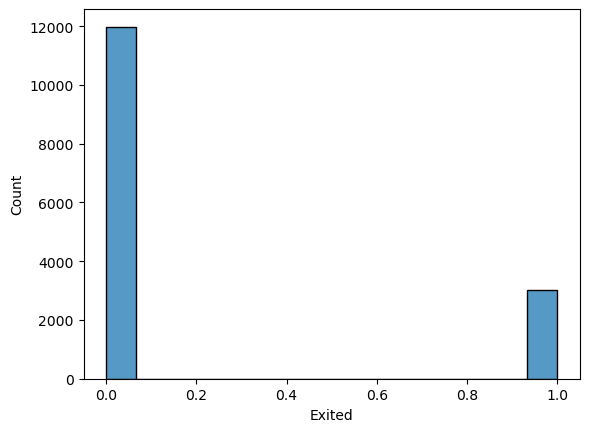

In [163]:
# visualización de la variable objetivo

sns.histplot(data['Exited']) # 0: no se fue, 1: se fue. Los datos se encuentran desbalanceados

In [164]:
data['Exited'].value_counts() # 11981 no se fueron, 3019 se fueron

Exited
0.0    11981
1.0     3019
Name: count, dtype: int64

Tratado de variables categóricas

In [165]:
#Convirtiendo variables categóricas a numéricas

data_geo_dummy = pd.get_dummies(data, columns=['Geography','Gender'])
data_geo_dummy.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
0,597.0,45.0,7.0,0.00,1.0,1.0,1.0,72643.95,1.0,True,False,False,False,True
1,738.0,28.0,1.0,0.00,2.0,1.0,0.0,96885.19,0.0,False,False,True,True,False
2,705.0,47.0,7.0,69311.16,1.0,0.0,1.0,123866.43,0.0,True,False,False,False,True
3,681.0,51.0,4.0,181110.13,1.0,1.0,0.0,103560.98,1.0,False,True,False,True,False
4,479.0,31.0,6.0,133043.66,2.0,1.0,0.0,61936.22,0.0,False,True,False,False,True


In [166]:
# Variables

X = data_geo_dummy.drop(columns='Exited')
y = data_geo_dummy['Exited']

División de datos en train y test

In [167]:
#Dividiendo los datos en entrenamiento y prueba

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Escalamiento de Datos

In [168]:
# Escalando datos

X_scaler = StandardScaler()
X_train = X_scaler.fit_transform(X_train)
X_test = X_scaler.transform(X_test)

In [169]:
X_train

array([[-1.76055651,  1.11982472,  1.05647844, ..., -0.52992426,
        -0.88087233,  0.88087233],
       [ 0.80876882,  0.14480116, -1.79197211, ..., -0.52992426,
        -0.88087233,  0.88087233],
       [ 1.60995629, -0.58646652, -0.01169052, ..., -0.52992426,
        -0.88087233,  0.88087233],
       ...,
       [ 1.02978605, -1.43961214, -0.36774683, ...,  1.88706211,
        -0.88087233,  0.88087233],
       [ 0.39436151, -0.83022241, -0.01169052, ..., -0.52992426,
        -0.88087233,  0.88087233],
       [-1.91250585,  0.51043499,  1.41253476, ..., -0.52992426,
         1.13523829, -1.13523829]])

In [170]:
X_test

array([[ 1.07122678,  1.11982472, -1.43591579, ..., -0.52992426,
         1.13523829, -1.13523829],
       [ 0.28385289, -1.80524597, -0.01169052, ...,  1.88706211,
         1.13523829, -1.13523829],
       [-0.84886042,  3.1917498 ,  1.05647844, ..., -0.52992426,
        -0.88087233,  0.88087233],
       ...,
       [ 0.17334428,  2.33860418, -0.01169052, ...,  1.88706211,
         1.13523829, -1.13523829],
       [-0.18580873,  1.24170267,  1.41253476, ...,  1.88706211,
        -0.88087233,  0.88087233],
       [ 0.6982602 ,  0.51043499, -1.43591579, ..., -0.52992426,
        -0.88087233,  0.88087233]])

SELECCIÓN DE MODELOS

Modelo de Regresion Logística

In [171]:
# Modelo de regresión logística

model = LogisticRegression()
model.fit(X_train, y_train)
predictions = model.predict(X_test)
y_probs = model.predict_proba(X_test)[:, 1] # Probabilidad de que se vaya
score_lreg = roc_auc_score(y_test, y_probs)
round(score_lreg,3)

0.885

In [172]:
model = LogisticRegression(class_weight='balanced', random_state=42)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
y_probs = model.predict_proba(X_test)[:, 1] # Probabilidad de que se vaya
score_lregunbalanced = roc_auc_score(y_test, y_probs)
round(score_lregunbalanced,3)

0.885

Regresión logistica con penalización

L2 = Ridge

In [173]:
model = LogisticRegression(penalty='l2', C=0.1)  # Regularización Ridge (L2)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
y_probs = model.predict_proba(X_test)[:, 1] # Probabilidad de que se vaya
score_lregl2 = roc_auc_score(y_test, y_probs)
round(score_lregl2,3)

0.885

L1 = Lasso

In [174]:
model = LogisticRegression(penalty='l1', solver='liblinear', C=0.1)  # Regularización Ridge (L1)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
y_probs = model.predict_proba(X_test)[:, 1] # Probabilidad de que se vaya
score_lregl1 = roc_auc_score(y_test, y_probs)
round(score_lregl1,3)

0.885

Modelos avanzados

Random Forest

In [175]:
# Modelo de Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
y_probs = model.predict_proba(X_test)[:, 1] # Probabilidad de que se vaya
score_rf = roc_auc_score(y_test, y_probs)
round(score_rf,3)

0.929

XGBoost

In [176]:
# Modelo de Gradient Boosting
model = XGBClassifier(random_state=42)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
y_probs = model.predict_proba(X_test)[:, 1] # Probabilidad de que se vaya
score_XGB = roc_auc_score(y_test, y_probs)
round(score_XGB,3)

0.929

LGBMClassifier

In [177]:
# Modelo de LightGBM
model = LGBMClassifier(is_unbalance=True, random_state=42)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
y_probs = model.predict_proba(X_test)[:, 1] # Probabilidad de que se vaya
score_XGB = roc_auc_score(y_test, y_probs)
round(score_XGB,3)

[LightGBM] [Info] Number of positive: 2414, number of negative: 9586
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 852
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.201167 -> initscore=-1.379019
[LightGBM] [Info] Start training from score -1.379019


0.936

Ajuste de hiperparametros

Random Forest con GridSearchCV

In [178]:
# Optimización de hiperparámetros
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

model = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train, y_train)

print("Mejores parámetros:", grid_search.best_params_)

Mejores parámetros: {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 200}


In [179]:
model = RandomForestClassifier(n_estimators=200, max_depth = 10, min_samples_split= 10, random_state=42)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
y_probs = model.predict_proba(X_test)[:, 1] # Probabilidad de que se vaya
score_rf_gscv = roc_auc_score(y_test, y_probs)
round(score_rf_gscv,3)

0.936

Random Forest con BayesSearchCV

In [180]:
!pip install scikit-optimize

In [181]:
# Optimización de hiperparámetros con BayesSearchCV
param_space = {
    'n_estimators': (50, 200),
    'max_depth': (10, 50),
    'min_samples_split': (2, 10)
}

model = RandomForestClassifier(random_state=42)
bayes_search = BayesSearchCV(model, param_space, n_iter=20, cv=5, scoring='roc_auc', random_state=42)
bayes_search.fit(X_train, y_train)

print("Mejores parámetros:", bayes_search.best_params_)

Mejores parámetros: OrderedDict({'max_depth': 10, 'min_samples_split': 6, 'n_estimators': 200})


In [182]:
model = RandomForestClassifier(n_estimators=200, max_depth = 10, min_samples_split= 6, random_state=42)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
y_probs = model.predict_proba(X_test)[:, 1] # Probabilidad de que se vaya
score_rf_bayes = roc_auc_score(y_test, y_probs)
round(score_rf_bayes,3)

0.936

Light Gradient Boosting Classifier

In [206]:
param_grid = {'learning_rate': [0.01, 0.1, 0.3], 
                'n_estimators': [100, 300, 500], 
                'max_depth': [4, 6, 8],
                'num_leaves': [20, 30, 40],
                'min_data_in_leaf': [30, 50, 70]}

cv = StratifiedKFold(n_splits=5)
model = LGBMClassifier(is_unbalance=True, random_state=42)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train, y_train)

print("Mejores parámetros:", grid_search.best_params_) 
#Mejores parámetros: {'learning_rate': 0.1, 'max_depth': 4, 'min_data_in_leaf': 30, 'n_estimators': 100, 'num_leaves': 20}

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Info] Number of positive: 1932, number of negative: 7668
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 853
[LightGBM] [Info] Number of data points in the train set: 9600, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.201250 -> initscore=-1.378500
[LightGBM] [Info] Start training from score -1.378500
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

In [195]:
model = LGBMClassifier(is_unbalance=True, random_state=42, learning_rate=0.1, max_depth=4, min_data_in_leaf=30, n_estimators=100, num_leaves=20)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
y_probs = model.predict_proba(X_test)[:, 1] # Probabilidad de que se vaya
score_LGBM_gscv = roc_auc_score(y_test, y_probs)
round(score_LGBM_gscv,3) #0.939

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Info] Number of positive: 2414, number of negative: 9586
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000689 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 852
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.201167 -> initscore=-1.379019
[LightGBM] [Info] Start training from score -1.379019
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

0.939

EVALUACIÓN DE MODELOS

Score de modelos

<BarContainer object of 9 artists>

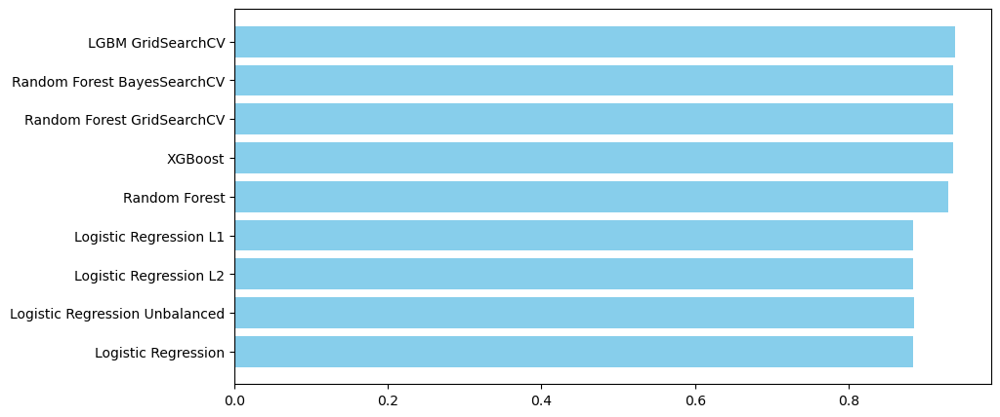

In [207]:
scores = [score_lreg, score_lregunbalanced, score_lregl2, score_lregl1, score_rf, score_XGB, score_rf_gscv, score_rf_bayes, score_LGBM_gscv]
models = ['Logistic Regression', 'Logistic Regression Unbalanced', 'Logistic Regression L2', 'Logistic Regression L1', 'Random Forest', 'XGBoost', 'Random Forest GridSearchCV', 'Random Forest BayesSearchCV', 'LGBM GridSearchCV']

plt.figure(figsize=(10,5))
plt.barh(models, scores, color='skyblue')  

In [208]:
# Crear DataFrame con los modelos y sus scores
df_scores = pd.DataFrame({'Model': models, 'Score': scores})

# Mostrar la tabla ordenada por Score
df_scores = df_scores.sort_values(by='Score', ascending=False).reset_index(drop=True)

# Mostrar tabla
print(df_scores)

                            Model     Score
0               LGBM GridSearchCV  0.938820
1                         XGBoost  0.936174
2     Random Forest BayesSearchCV  0.935934
3      Random Forest GridSearchCV  0.935733
4                   Random Forest  0.929243
5  Logistic Regression Unbalanced  0.885133
6          Logistic Regression L1  0.884603
7          Logistic Regression L2  0.884601
8             Logistic Regression  0.884574


SUBMIT

Preparación de archivo de entrega

In [209]:
test = pd.read_csv('datasets/test.csv')
test.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,15000,15790594.0,Hsia,596.0,Spain,Female,32.0,2.0,0.00,1.0,1.0,1.0,153566.97
1,15001,15581229.0,Hs?,682.0,Spain,Female,35.0,1.0,0.00,2.0,1.0,1.0,136050.44
2,15002,15741092.0,Toscani,665.0,France,Male,37.0,7.0,0.00,2.0,1.0,1.0,79691.40
3,15003,15592773.0,Ku,567.0,Germany,Female,40.0,10.0,131082.17,2.0,0.0,0.0,71692.80
4,15004,15726250.0,Cattaneo,716.0,France,Male,28.0,4.0,0.00,2.0,1.0,0.0,91711.66


In [210]:
X_test_to_submit = test.drop(columns=columns_to_drop)
X_test_to_submit

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,596.0,Spain,Female,32.0,2.0,0.00,1.0,1.0,1.0,153566.97
1,682.0,Spain,Female,35.0,1.0,0.00,2.0,1.0,1.0,136050.44
2,665.0,France,Male,37.0,7.0,0.00,2.0,1.0,1.0,79691.40
3,567.0,Germany,Female,40.0,10.0,131082.17,2.0,0.0,0.0,71692.80
4,716.0,France,Male,28.0,4.0,0.00,2.0,1.0,0.0,91711.66
...,...,...,...,...,...,...,...,...,...,...
9995,590.0,France,Male,51.0,3.0,0.00,1.0,1.0,0.0,172634.68
9996,713.0,Spain,Male,25.0,3.0,0.00,2.0,1.0,1.0,163558.21
9997,652.0,Spain,Female,37.0,9.0,97270.64,2.0,0.0,0.0,123882.73
9998,679.0,Spain,Male,45.0,7.0,0.00,2.0,1.0,1.0,156598.23


In [211]:
X_test_to_submit = pd.get_dummies(X_test_to_submit, columns=['Geography','Gender'])
X_test_to_submit.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
0,596.0,32.0,2.0,0.00,1.0,1.0,1.0,153566.97,False,False,True,True,False
1,682.0,35.0,1.0,0.00,2.0,1.0,1.0,136050.44,False,False,True,True,False
2,665.0,37.0,7.0,0.00,2.0,1.0,1.0,79691.40,True,False,False,False,True
3,567.0,40.0,10.0,131082.17,2.0,0.0,0.0,71692.80,False,True,False,True,False
4,716.0,28.0,4.0,0.00,2.0,1.0,0.0,91711.66,True,False,False,False,True


In [212]:
# preparando archivo de test para predecir

X_test_to_submit = X_scaler.transform(X_test_to_submit)

X_test_to_submit

array([[-0.862674  , -0.70834446, -1.07985947, ...,  1.88706211,
         1.13523829, -1.13523829],
       [ 0.32529362, -0.34271063, -1.43591579, ...,  1.88706211,
         1.13523829, -1.13523829],
       [ 0.09046281, -0.09895474,  0.70042212, ..., -0.52992426,
        -0.88087233,  0.88087233],
       ...,
       [-0.08911369, -0.09895474,  1.41253476, ...,  1.88706211,
         1.13523829, -1.13523829],
       [ 0.28385289,  0.87606883,  0.70042212, ...,  1.88706211,
        -0.88087233,  0.88087233],
       [-0.144368  , -0.09895474,  1.05647844, ..., -0.52992426,
        -0.88087233,  0.88087233]])

In [213]:
model = LGBMClassifier(is_unbalance=True, random_state=42, learning_rate=0.1, max_depth=3, n_estimators=100)
model.fit(X_train, y_train)
predictions = model.predict(X_test_to_submit)
y_probs_submit = model.predict_proba(X_test_to_submit)[:, 1] # Probabilidad de que se vaya
predictions

[LightGBM] [Info] Number of positive: 2414, number of negative: 9586
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 852
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.201167 -> initscore=-1.379019
[LightGBM] [Info] Start training from score -1.379019
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

array([0., 0., 0., ..., 0., 0., 0.])

In [214]:
#Crear archivo de submit con id y predicciones

submit = pd.DataFrame({'id': test['id'], 'Exited': predictions})
submit.head()

,id,Exited
0,15000,0.0
1,15001,0.0
2,15002,0.0
3,15003,1.0
4,15004,0.0


In [215]:
#to_csv
submit.to_csv('submit4.csv',index=False)